In [1]:
import numpy as np
from sklearn.decomposition import PCA
import glob
import matplotlib.pyplot as plt
from skimage.transform import resize
from sklearn.mixture import GaussianMixture
import cv2 as cv
from PIL import Image
plt.rcParams['figure.figsize'] = [20, 10]

In [2]:
class DeepLab:
    
    def __init__(self, selected_layer=405):
        from model import Deeplabv3
        import tensorflow as tf
        
        self.model = Deeplabv3(weights="pascal_voc", input_shape=(360, 640, 3), backbone="xception", classes=21)
        self.model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
        outputs = [layer.output for layer in self.model.layers]
        self.model = tf.keras.models.Model(inputs=self.model.inputs, outputs=outputs)
        
        for layer in self.model.layers: layer.trainable = False
        self.image_list = []
        self.selected_layer = selected_layer

    def preprocess_image(self, image):
        image = resize(image, (360, 640), anti_aliasing=True)
        image = np.expand_dims(image, axis=0)
        return image

    def get_features(self):
        feature_list = []
        for img in self.image_list:
            feature_map = self.model.predict(img)[self.selected_layer]
            feature_list.append(feature_map)
        return np.array(feature_list)
    
    def predict(self, image):
        image = self.preprocess_image(image)
        return self.model.predict(image)[self.selected_layer]

In [3]:
deeplab = DeepLab()
pca = PCA(n_components=8)

In [4]:
gmm_6 = GaussianMixture(n_components=6, covariance_type='tied')
gmm_4 = GaussianMixture(n_components=4, covariance_type='tied')

In [5]:
def deeplab_prediction(image_name):
    from model import Deeplabv3

    # Generates labels using most basic setup.  Supports various image sizes.  Returns image labels in same format
    # as original image.  Normalization matches MobileNetV2

    trained_image_width=512 
    mean_subtraction_value=127.5
    image = np.array(Image.open(image_name))

    # resize to max dimension of images from training dataset
    w, h, _ = image.shape
    ratio = float(trained_image_width) / np.max([w, h])
    resized_image = np.array(Image.fromarray(image.astype('uint8')).resize((int(ratio * h), int(ratio * w))))

    # apply normalization for trained dataset images
    resized_image = (resized_image / mean_subtraction_value) - 1.

    # pad array to square image to match training images
    pad_x = int(trained_image_width - resized_image.shape[0])
    pad_y = int(trained_image_width - resized_image.shape[1])
    resized_image = np.pad(resized_image, ((0, pad_x), (0, pad_y), (0, 0)), mode='constant')

    # make prediction
    deeplab_model = Deeplabv3()
    res = deeplab_model.predict(np.expand_dims(resized_image, 0))
    labels = np.argmax(res.squeeze(), -1)

    # remove padding and resize back to original image
    if pad_x > 0:
        labels = labels[:-pad_x]
    if pad_y > 0:
        labels = labels[:, :-pad_y]
    labels = np.array(Image.fromarray(labels.astype('uint8')).resize((h, w)))

    return labels

In [6]:
def get_binary(class_image):
    numclasses = len(np.unique(class_image))
    heuristic = [0] * numclasses

    for k in range(numclasses):
        tt = (class_image == k)
        tt2 = np.where(tt)
        xs = np.abs(tt2[0] - np.round(class_image.shape[0]/2))
        ys = np.abs(tt2[1] - np.round(class_image.shape[1]/2))
        heuristic[k] = np.sqrt(np.mean(xs)**2 + np.mean(ys)**2)
        
    foreground_class = np.argmin(heuristic)
    outseg = np.zeros([class_image.shape[0], class_image.shape[1]])
    tt = np.zeros_like(class_image)

    tt[pred_filtered_4 == foreground_class] = 0xff #this is actually the colour I used for the windows (but its ok..)
    tt[pred_filtered_4 != foreground_class] = 0x00
    outseg = tt
    return outseg.astype(int)

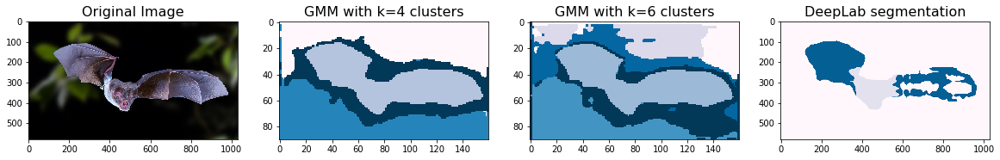

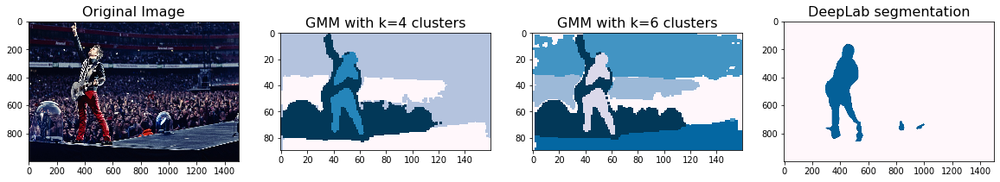

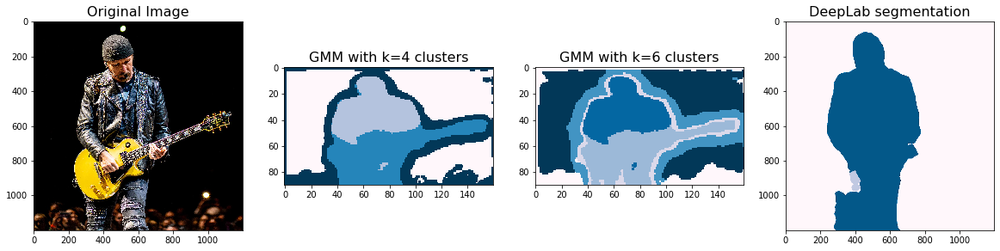

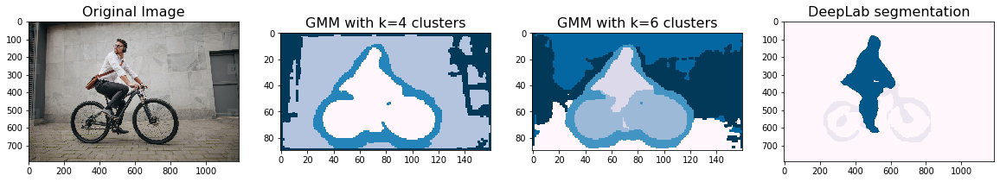

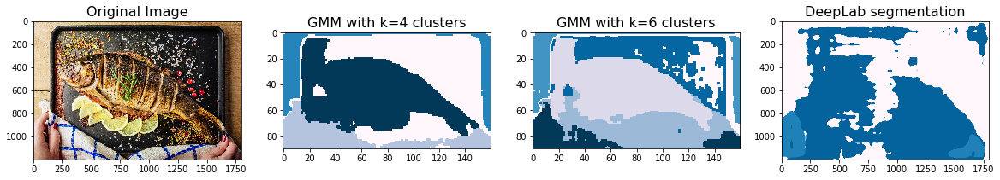

...

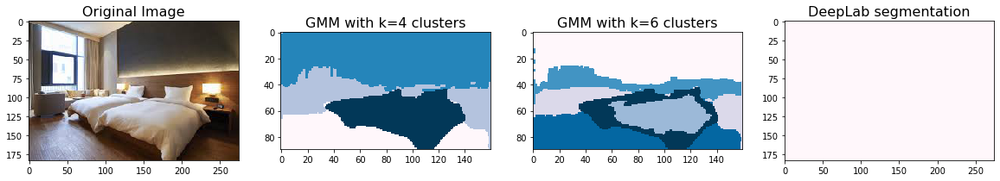

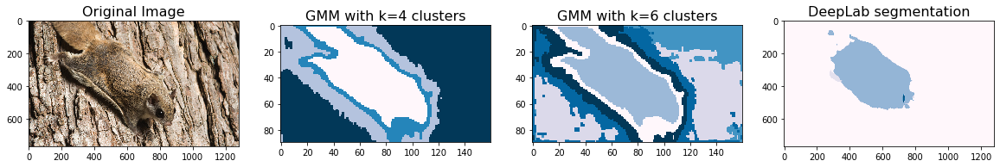

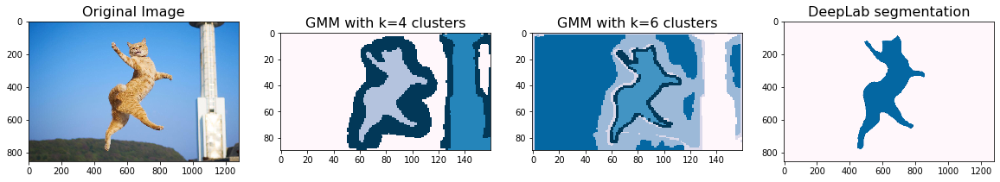

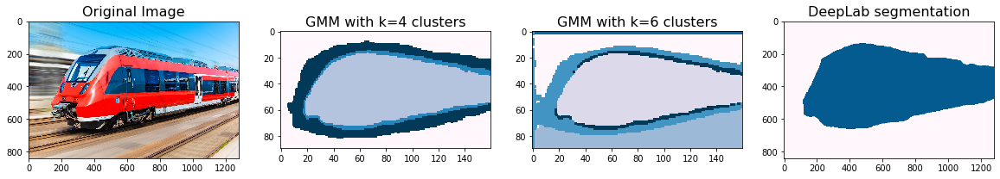

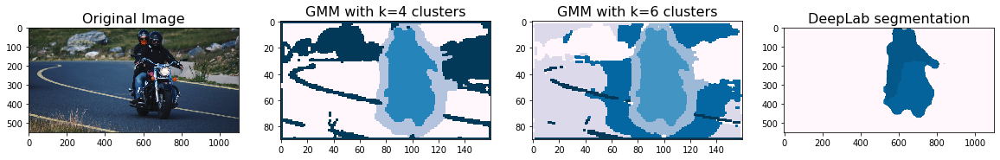

In [7]:
for name in glob.glob('C:\\Users\\me\\Desktop\\pics\\*'):
    img = plt.imread(name)
    
    features = deeplab.predict(img)
    n, w, h, d = features.shape
    reduced_features = pca.fit_transform(features.reshape(-1, d))

    pred_6 = gmm_6.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
    pred_4 = gmm_4.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
    
    pred_filtered_4 = cv.morphologyEx(pred_4.astype(float), cv.MORPH_OPEN, np.ones((2,2)))
    pred_filtered_6 = cv.morphologyEx(pred_6.astype(float), cv.MORPH_OPEN, np.ones((2,2)))

    plt.subplot(1,4,1)
    plt.title('Original Image', fontsize=16)
    plt.imshow(img)
    plt.subplot(1,4,2)
    plt.title('GMM with k=4 clusters', fontsize=16)
    plt.imshow(pred_filtered_4, cmap='PuBu')
    plt.subplot(1,4,3)
    plt.title('GMM with k=6 clusters', fontsize=16)
    plt.imshow(pred_filtered_6, cmap='PuBu')
    plt.subplot(1,4,4)
    plt.title('DeepLab segmentation', fontsize=16)
    plt.imshow(deeplab_prediction(name), cmap='PuBu')
    plt.show()

In [8]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)

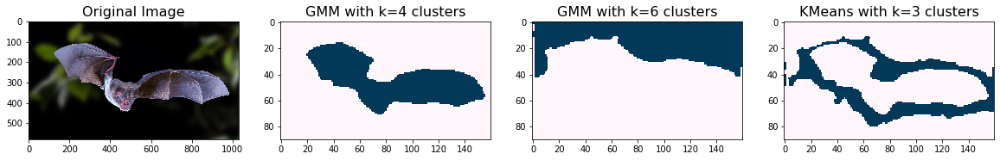

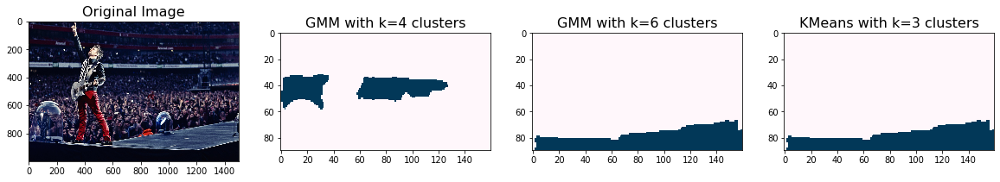

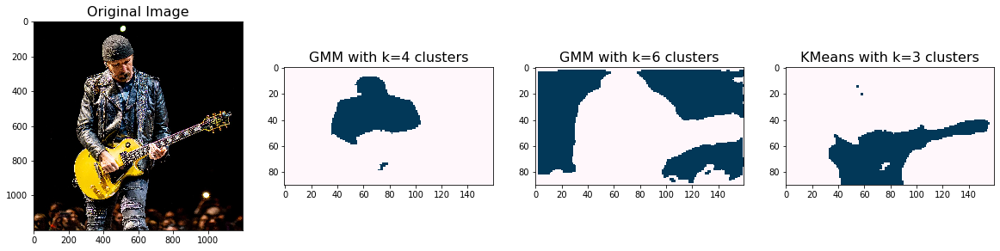

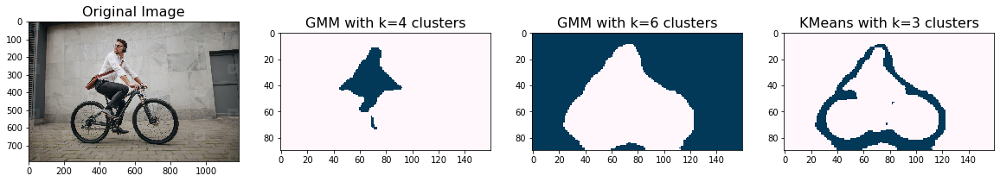

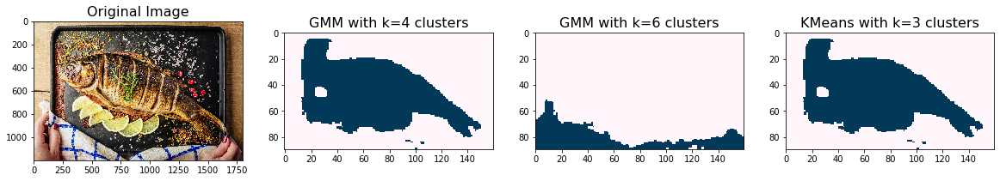

...

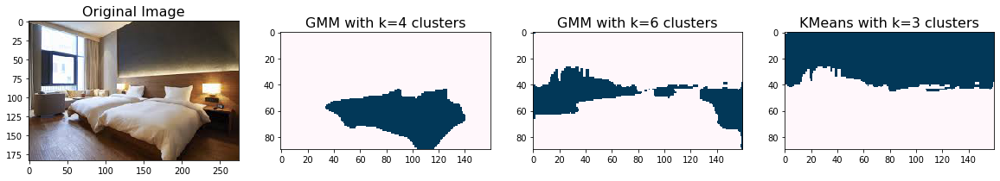

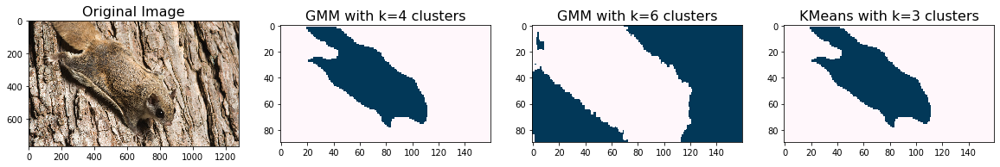

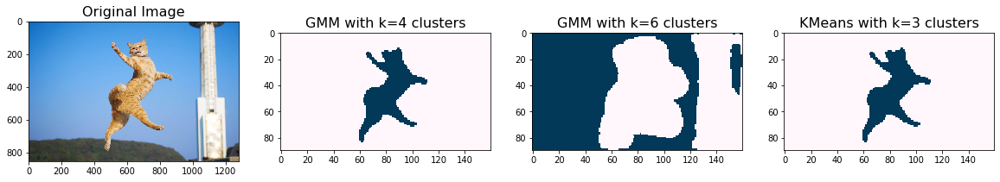

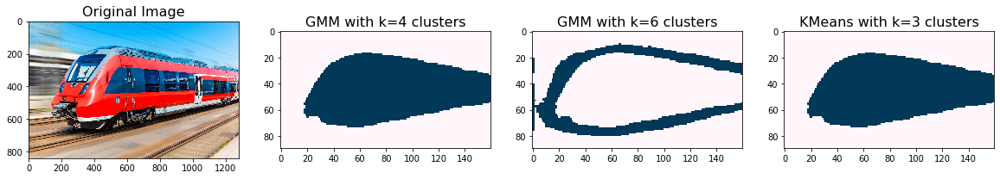

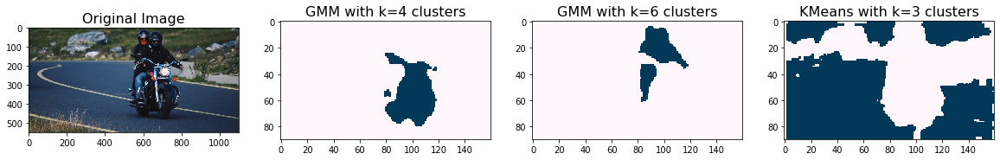

In [9]:
for name in glob.glob('C:\\Users\\me\\Desktop\\pics\\*'):
    img = plt.imread(name)
    
    features = deeplab.predict(img)
    n, w, h, d = features.shape
    reduced_features = pca.fit_transform(features.reshape(-1, d))

    pred_6 = gmm_6.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
    pred_4 = gmm_4.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)
    
    pred_filtered_4 = cv.morphologyEx(pred_4.astype(float), cv.MORPH_OPEN, np.ones((2,2)))
    pred_filtered_6 = cv.morphologyEx(pred_6.astype(float), cv.MORPH_OPEN, np.ones((2,2)))
    kmeans_3 = kmeans.fit_predict(reduced_features.reshape(-1, 8)).reshape(90, 160)

    plt.subplot(1,4,1)
    plt.title('Original Image', fontsize=16)
    plt.imshow(img)
    plt.subplot(1,4,2)
    plt.title('GMM with k=4 clusters', fontsize=16)
    plt.imshow(get_binary(pred_filtered_4), cmap='PuBu')
    plt.subplot(1,4,3)
    plt.title('GMM with k=6 clusters', fontsize=16)
    plt.imshow(get_binary(pred_filtered_6), cmap='PuBu')
    plt.subplot(1,4,4)
    plt.title('KMeans with k=3 clusters', fontsize=16)
    plt.imshow(get_binary(kmeans_3), cmap='PuBu')
    plt.show()